## Running VAE with Signature Priors on Visium breast tissue

In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
import matplotlib.pyplot as plt

from copy import deepcopy
from matplotlib.pyplot import rc_context

In [2]:
from vae import SignatureVAE
from vae import plot as vae_plot
from vae import utils

### Load dataset & calculate signature variance priors

Load Visium datasets, signature matrix & GSVA scores

Modify the relative path & file names 

In [3]:
data_path = '../../data/'
signature_path = '../../signature/' 
gsva_path = '../../gsva/'

In [4]:
%%bash
# ls '../../data/' '../../gsva/' '../../signature'

In [4]:
sample_id = '1b'
sig_genes_dict = utils.load_sig(signature_path, 'BC_cellsignatures.csv')
df_gsva, df_gsva_train = utils.load_gsva(gsva_path, 'markers_gsva_{}.csv'.format(sample_id))
adata = sc.read_visium(path=os.path.join(data_path, sample_id), library_id='BC_' + sample_id)
adata.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Preprocessing & manifold embedding <br>
Log-norm transform, remove spots with excessive MT gexp & Ribosomal gexp

In [5]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor='seurat', n_top_genes=5000, inplace=True)
adata = utils.preprocess(adata)

# Manifold Embedding 
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata, n_components=3)
sc.tl.leiden(adata, key_added="clusters")


Find `pseudospots / peripheral-spots` as k-NNs ($k=30$) of the purest spots representing each signature

In [6]:
pure_spots, perif_spots = utils.find_spots(adata, df_gsva)

/home/yinuo/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


Visualize pseudospots in UMAP & spatial coordinates

... storing 'pure_val' as categorical
... storing 'perif_val' as categorical
... storing 'perif_unique_val' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


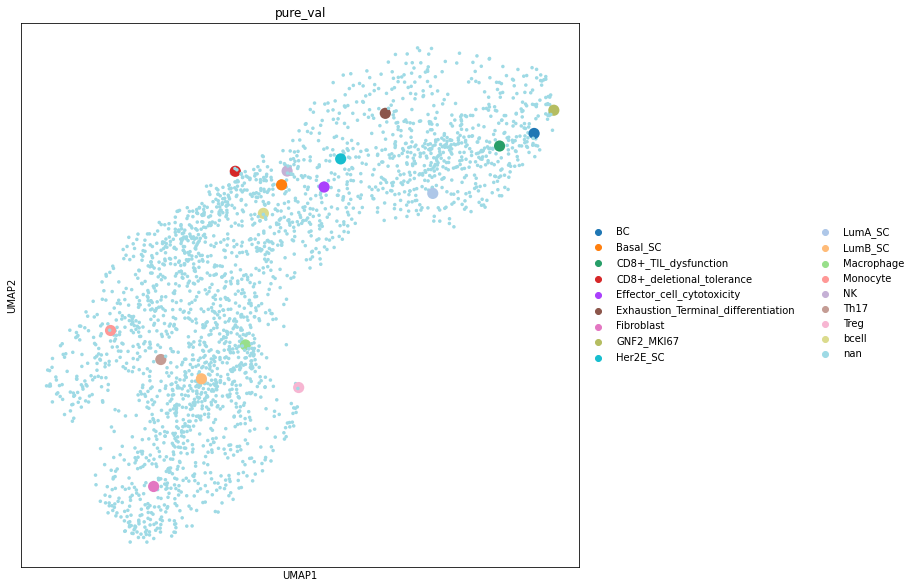

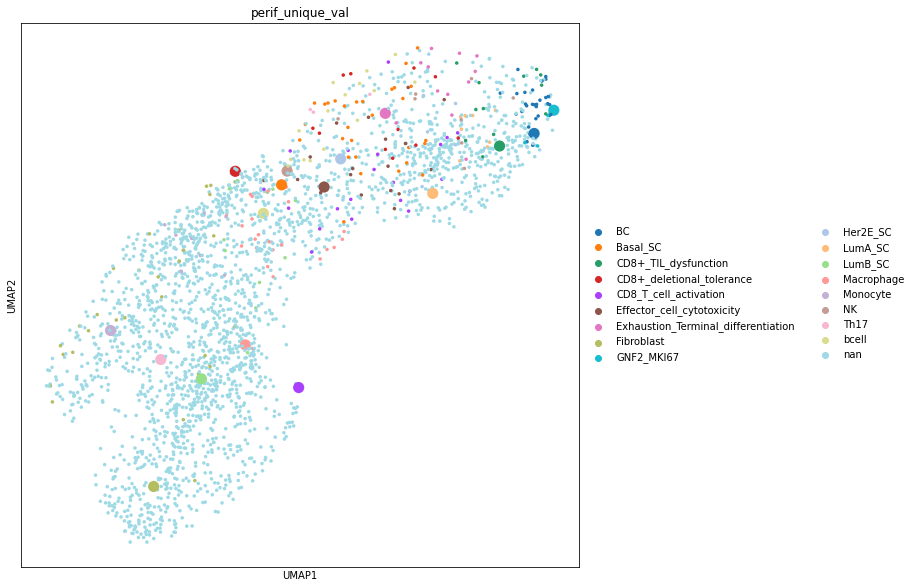

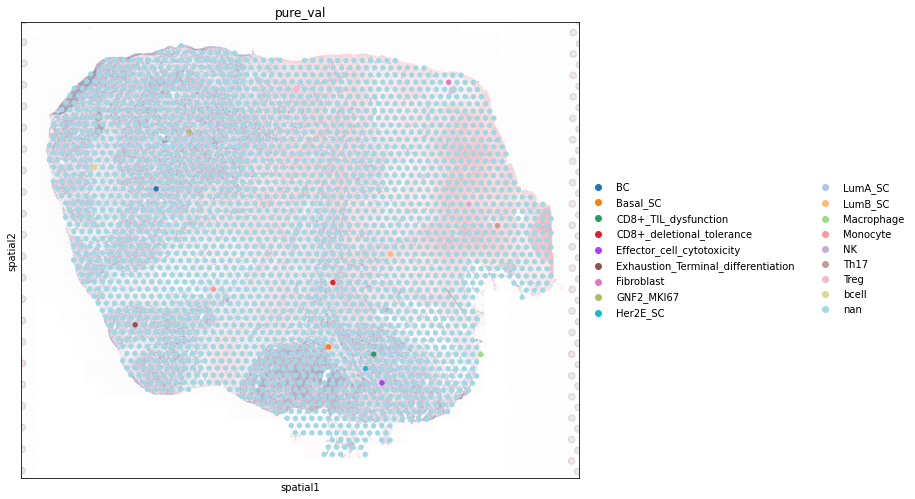

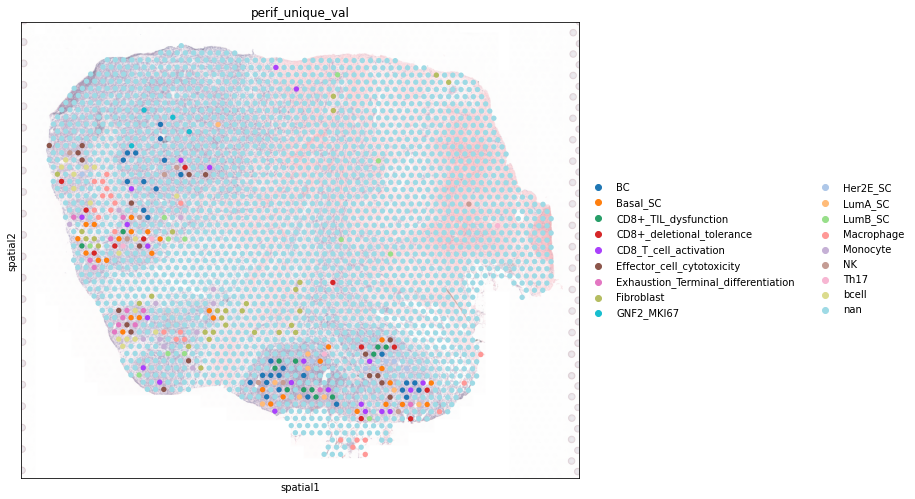

In [7]:
spot_size = adata.obs_names.map(lambda x: 500 if x in set(pure_spots) else 50)
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color='pure_val', size=spot_size)
    sc.pl.umap(adata, color='perif_unique_val', size=spot_size)
    sc.pl.spatial(adata, img_key='hires', color='pure_val', alpha_img=0.5)
    sc.pl.spatial(adata, img_key='hires', color='perif_unique_val', alpha_img=0.5)

Calculate average variance of pseudospot (k-NNs of each purest spots) representing each signature as variance priors of latent space

In [8]:
sig_vars, sig_vars_dict = utils.calc_var_priors(adata, sig_genes_dict, return_dict=True)
for k, v in sig_vars_dict.items():
    print("{0}: {1}".format(k, v))

Th17: 1.2665935754776
Treg: 1.674498438835144
CD8_T_cell_activation: 1.1755892038345337
Exhaustion_Terminal_differentiation: 0.032560400664806366
CD8+_deletional_tolerance: 2.4067351818084717
CD8+_TIL_dysfunction: 1.9226435422897339
Effector_cell_cytotoxicity: 1.6366890668869019
bcell: 0.2726302742958069
Fibroblast: 4.377652645111084
Monocyte: 0.9448880553245544
Macrophage: 3.2333271503448486
NK: 0.36738109588623047
BC: 0.633728563785553
GNF2_MKI67: 6.65200138092041
Basal_SC: 6.232158184051514
Her2E_SC: 4.982659339904785
LumA_SC: 1.482452630996704
LumB_SC: 11.497583389282227


/home/yinuo/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


### VAE model training

In [9]:
from vae import SignatureVAE

**(1). VAE normal** <br>

To fit with Normal posterior, input matrix is log-normalized.

Training Spot x Gene expression matrix with only marker genes (signature gene + highly variable genes)

In [10]:
marker_genes = utils.get_marker_genes(adata, sig_genes_dict)
adata_train = adata[:, marker_genes]
in_features = adata_train.shape[1]
bn_features = len(sig_vars)

In [11]:
vae_normal = SignatureVAE(
    c_in=in_features,
    c_bn=bn_features,
    sig_vars_prior=sig_vars,
    n_layers=2,
    posterior='Normal'
)

losses_normal = utils.train(
    model=vae_normal,
    adata_train=adata_train,
    df_gsva_train=df_gsva_train,
    pseudo_spots=perif_spots,
    batch_size=128,
)

[Epoch 20]: NLL=4687.37; KL=17.32; Sig=0.38; Total Loss=94.47; α=0.020
[Epoch 40]: NLL=4188.25; KL=17.88; Sig=0.27; Total Loss=84.39; α=0.020
[Epoch 60]: NLL=3708.44; KL=18.88; Sig=0.22; Total Loss=74.76; α=0.020
[Epoch 80]: NLL=3242.16; KL=19.42; Sig=0.20; Total Loss=65.43; α=0.020
[Epoch 100]: NLL=2790.79; KL=20.67; Sig=0.18; Total Loss=56.41; α=0.020
[Epoch 120]: NLL=2558.84; KL=20.81; Sig=0.18; Total Loss=51.77; α=0.020
[Epoch 140]: NLL=2338.81; KL=21.32; Sig=0.18; Total Loss=47.38; α=0.020
[Epoch 160]: NLL=2123.57; KL=21.56; Sig=0.18; Total Loss=43.08; α=0.020
[Epoch 180]: NLL=1915.48; KL=22.22; Sig=0.17; Total Loss=35.04; α=0.018
[Epoch 200]: NLL=1727.34; KL=22.42; Sig=0.17; Total Loss=31.66; α=0.018
[Epoch 220]: NLL=1623.47; KL=22.95; Sig=0.16; Total Loss=26.50; α=0.016
[Epoch 240]: NLL=1531.71; KL=23.71; Sig=0.15; Total Loss=21.92; α=0.014
[Epoch 260]: NLL=1443.88; KL=23.71; Sig=0.15; Total Loss=20.69; α=0.014
[Epoch 280]: NLL=1354.05; KL=24.50; Sig=0.14; Total Loss=16.68; α=0.

In [12]:
# Infer latent space & reconstructed gexp with full training dataset (single forward-pass)
x_hat_normal, latent_normal = utils.run_inference(vae_normal, adata_train)

latent_normal.qz_mu_samp = latent_normal.qz_mu[
    np.vectorize(lambda x: adata_train.obs_names.get_loc(x))(perif_spots)
]

df_corr_bn = utils.calc_corr_gsva(
    latent_normal.qz_mu_samp,
    perif_spots,
    df_gsva
)

df_corr = utils.calc_corr_gsva(
    latent_normal.qz_mu,
    df_gsva.index,
    df_gsva
)

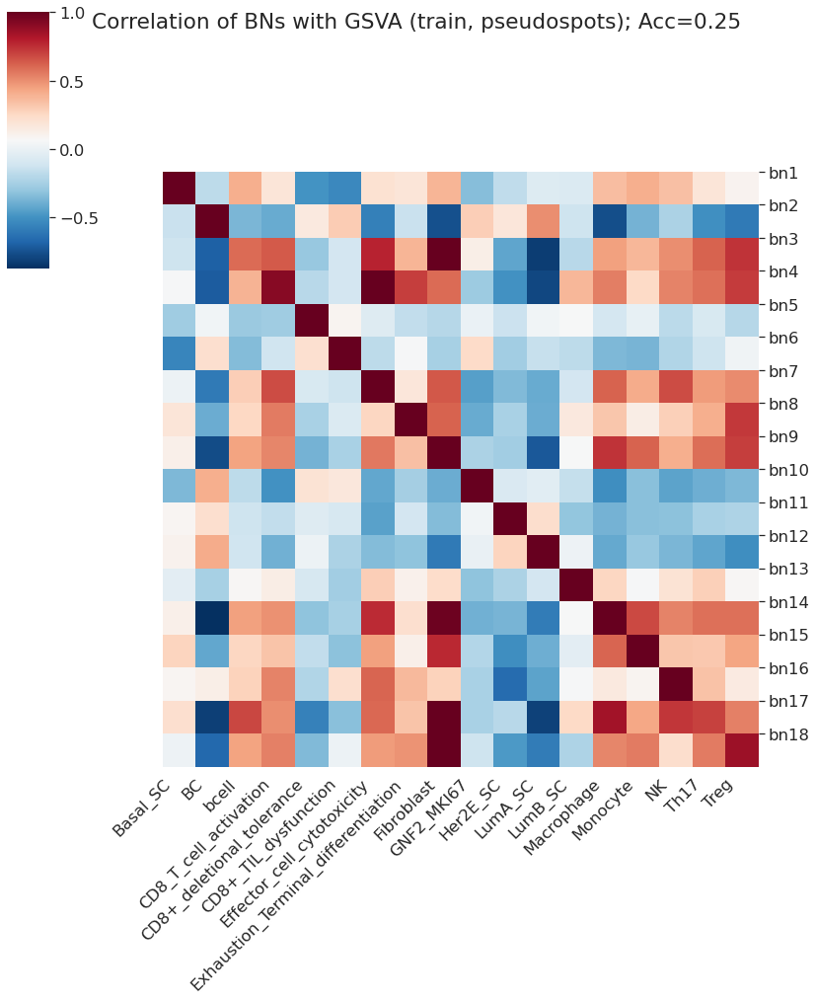

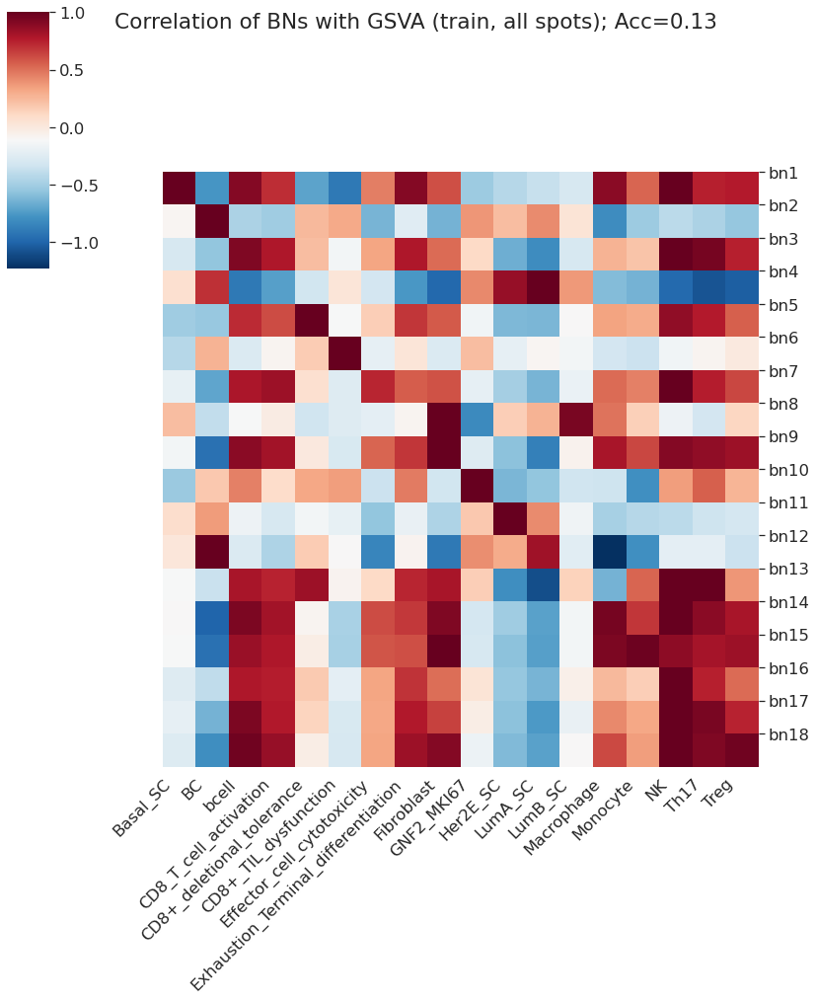

In [13]:
vae_plot.display_corr_gsva(
    df_corr_bn, 
    diag=True,
    title='Correlation of BNs with GSVA (train, pseudospots)'
)

vae_plot.display_corr_gsva(
    df_corr, 
    diag=True,
    title='Correlation of BNs with GSVA (train, all spots)'
)

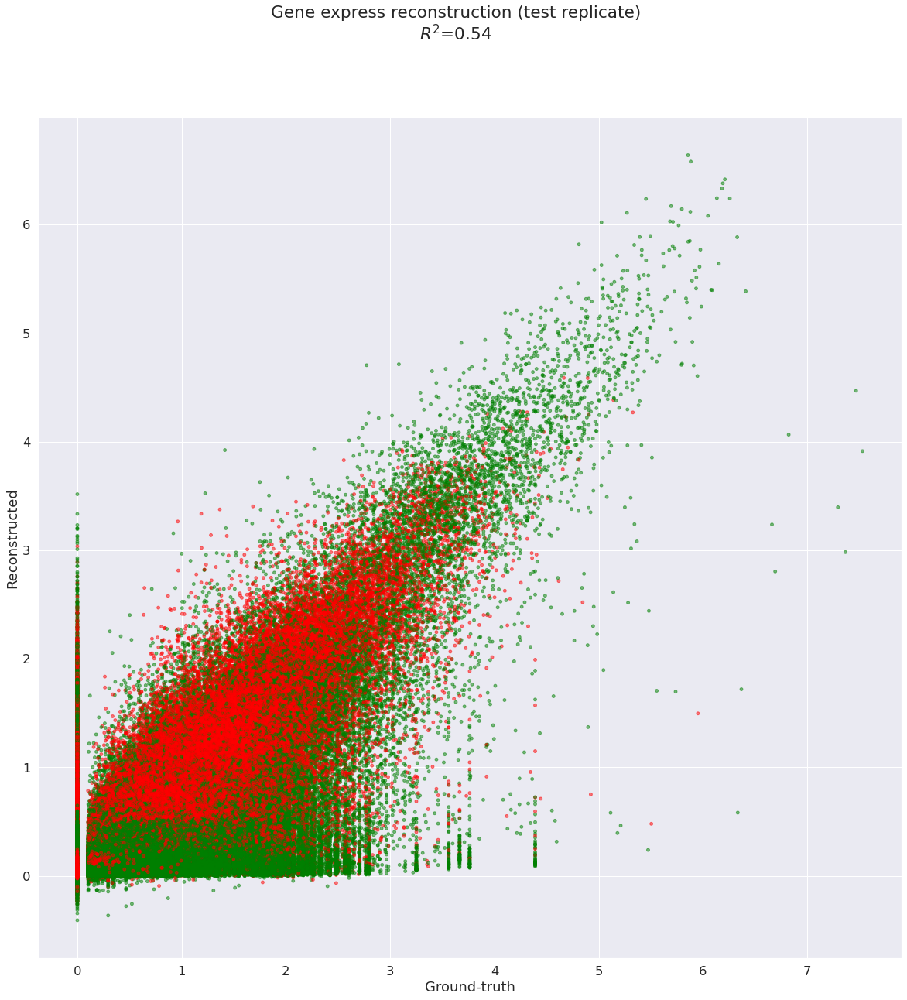

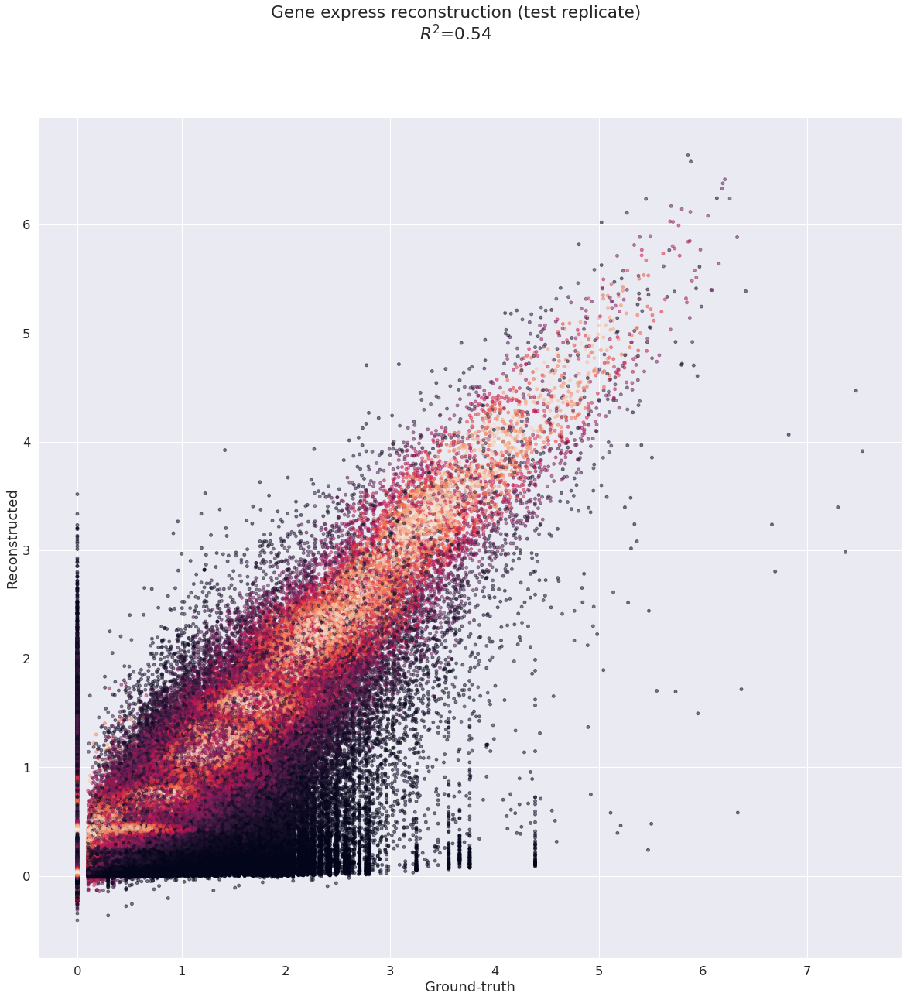

In [14]:
# Gexp reconstruction
df_x = pd.DataFrame(
    adata_train.X.A,
    index=adata_train.obs_names,
    columns=adata_train.var_names
)

df_x_hat = pd.DataFrame(
    x_hat_normal,
    index=adata_train.obs_names,
    columns=adata_train.var_names
    
)

r2 = utils.calc_r2(df_x.to_numpy().flatten(), df_x_hat.to_numpy().flatten())

vae_plot.display_reconst(
    df_x,
    df_x_hat,
    sample_rate=0.2,
    marker_genes=list(set([gene for genes in sig_genes_dict.values() for gene in genes])),
    title='Gene express reconstruction (test replicate)\n' + 
          r'$R^2$=' + str(round(r2, 2))
)


vae_plot.display_reconst(
    df_x,
    df_x_hat,
    sample_rate=0.2,
    density=True,
    title='Gene express reconstruction (test replicate)\n' + 
          r'$R^2$=' + str(round(r2, 2))
)


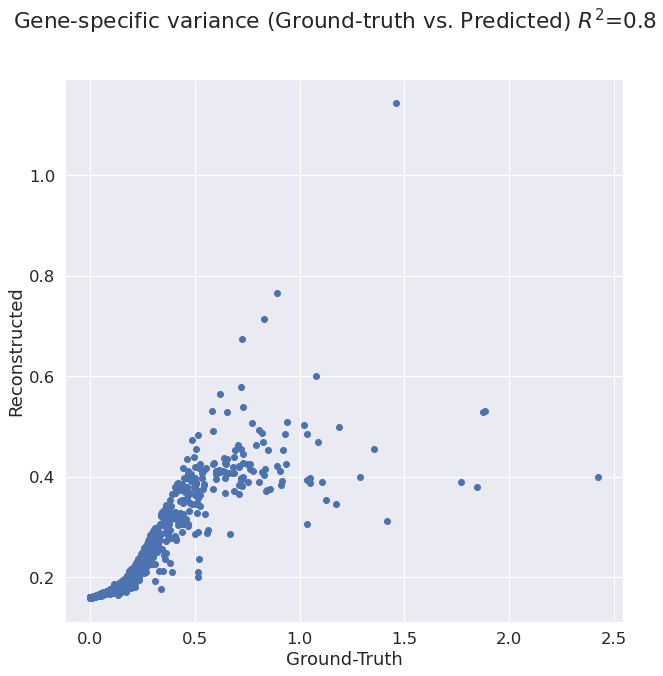

In [15]:
# Variance reconstruction
var_true = adata_train.X.A.var(axis=0)
var_pred = vae_normal.decoded.px_theta.detach().cpu().numpy()
vae_plot.display_gexp_var(var_true, var_pred, "Gene-specific variance (Ground-truth vs. Predicted)")

Trying to set attribute `.obs` of view, copying.


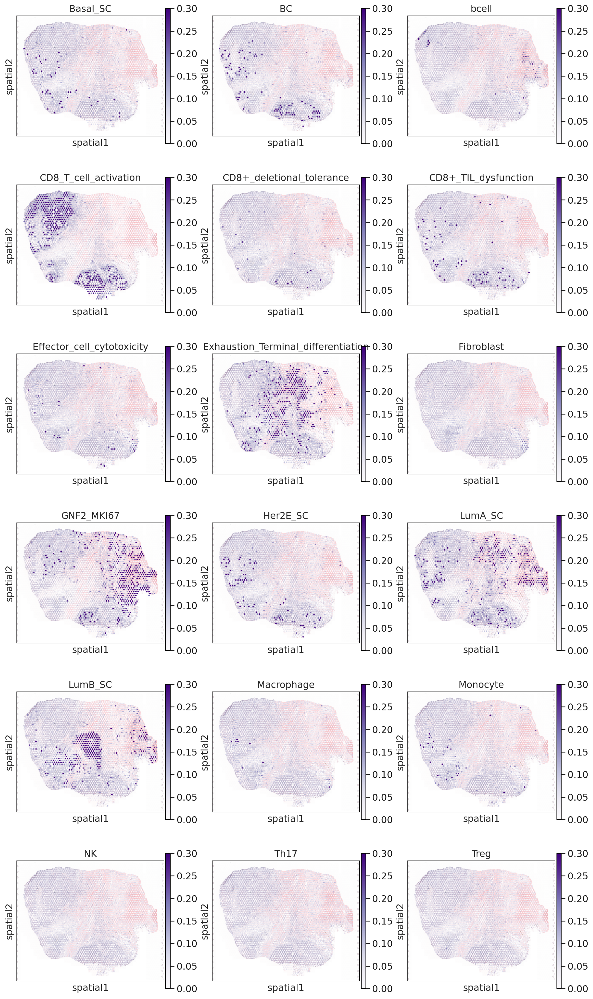

In [16]:
# Deconvolution in spatial coordinates
vae_plot.display_latent(adata_train, df_gsva, vae_normal)

**(2). VAE Negative Binomial**<br>

To fit with Negative Binomial posterior, input matrix is raw count without normalization. <br>The matrix is log-transformed for numerical stability after fed into the model and the decoded expression matrix represent log-transformed counts.

In [17]:
# Reload raw dataset
adata = sc.read_visium(path=os.path.join(data_path, sample_id), library_id='BC_' + sample_id)
adata.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [18]:
adata_train = adata[:, marker_genes]

In [19]:
vae_nb = SignatureVAE(
    c_in=in_features,
    c_bn=bn_features,
    sig_vars_prior=sig_vars,
    n_layers=2,
    posterior='NegBinom'
)

losses_nb = utils.train(
    model=vae_nb,
    adata_train=adata_train,
    df_gsva_train=df_gsva_train,
    pseudo_spots=perif_spots,
    batch_size=128,
)

[Epoch 20]: NLL=1615.01; KL=17.84; Sig=0.44; Total Loss=33.09; α=0.020
[Epoch 40]: NLL=1583.09; KL=17.70; Sig=0.37; Total Loss=32.38; α=0.020
[Epoch 60]: NLL=1559.62; KL=17.93; Sig=0.31; Total Loss=31.86; α=0.020
[Epoch 80]: NLL=1540.78; KL=18.55; Sig=0.27; Total Loss=31.45; α=0.020
[Epoch 100]: NLL=1525.46; KL=19.13; Sig=0.25; Total Loss=31.14; α=0.020
[Epoch 120]: NLL=1516.28; KL=19.29; Sig=0.24; Total Loss=30.94; α=0.020
[Epoch 140]: NLL=1508.89; KL=19.72; Sig=0.23; Total Loss=30.80; α=0.020
[Epoch 160]: NLL=1501.77; KL=19.64; Sig=0.22; Total Loss=30.64; α=0.020
[Epoch 180]: NLL=1495.58; KL=20.17; Sig=0.21; Total Loss=30.52; α=0.020
[Epoch 200]: NLL=1490.52; KL=20.29; Sig=0.21; Total Loss=30.42; α=0.020
[Epoch 220]: NLL=1486.97; KL=20.43; Sig=0.21; Total Loss=30.35; α=0.020
[Epoch 240]: NLL=1484.96; KL=20.54; Sig=0.20; Total Loss=30.31; α=0.020
[Epoch 260]: NLL=1481.99; KL=20.50; Sig=0.20; Total Loss=30.25; α=0.020
[Epoch 280]: NLL=1480.08; KL=20.72; Sig=0.20; Total Loss=28.71; α=0.

In [20]:
# Infer latent space & reconstructed gexp with full training dataset (single forward-pass)
x_hat_nb, latent_nb = utils.run_inference(vae_nb, adata_train)

latent_nb.qz_mu_samp = latent_nb.qz_mu[
    np.vectorize(lambda x: adata_train.obs_names.get_loc(x))(perif_spots)
]

df_corr_bn = utils.calc_corr_gsva(
    latent_nb.qz_mu_samp,
    perif_spots,
    df_gsva
)

df_corr = utils.calc_corr_gsva(
    latent_nb.qz_mu,
    df_gsva.index,
    df_gsva
)

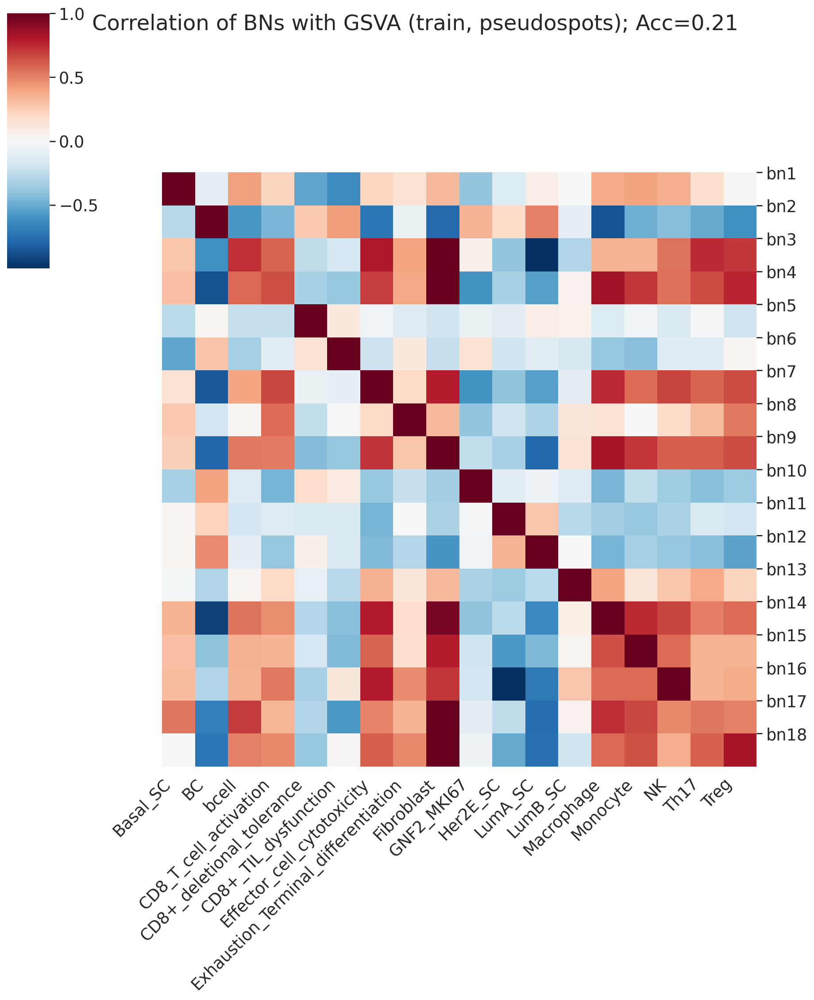

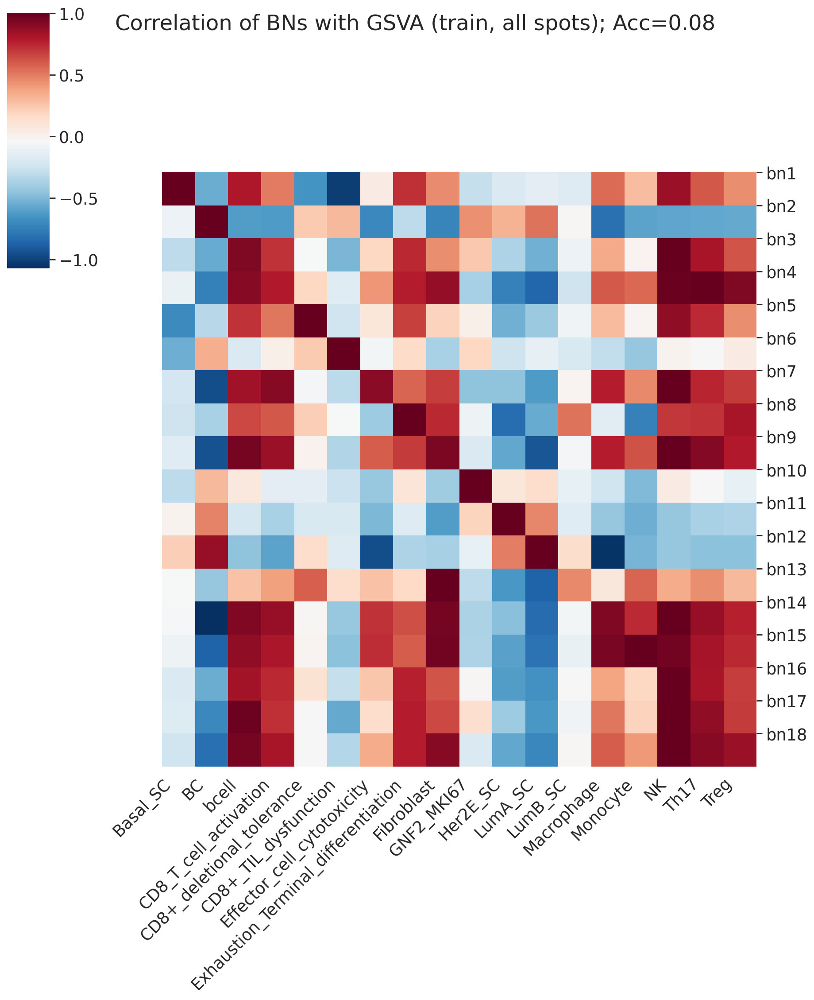

In [21]:
vae_plot.display_corr_gsva(
    df_corr_bn, 
    diag=True,
    title='Correlation of BNs with GSVA (train, pseudospots)'
)

vae_plot.display_corr_gsva(
    df_corr, 
    diag=True,
    title='Correlation of BNs with GSVA (train, all spots)'
)

Take log-transformation of the matrix for gexp reconstruction comparison

In [22]:
adata_train_log = sc.pp.log1p(adata_train, copy=True)

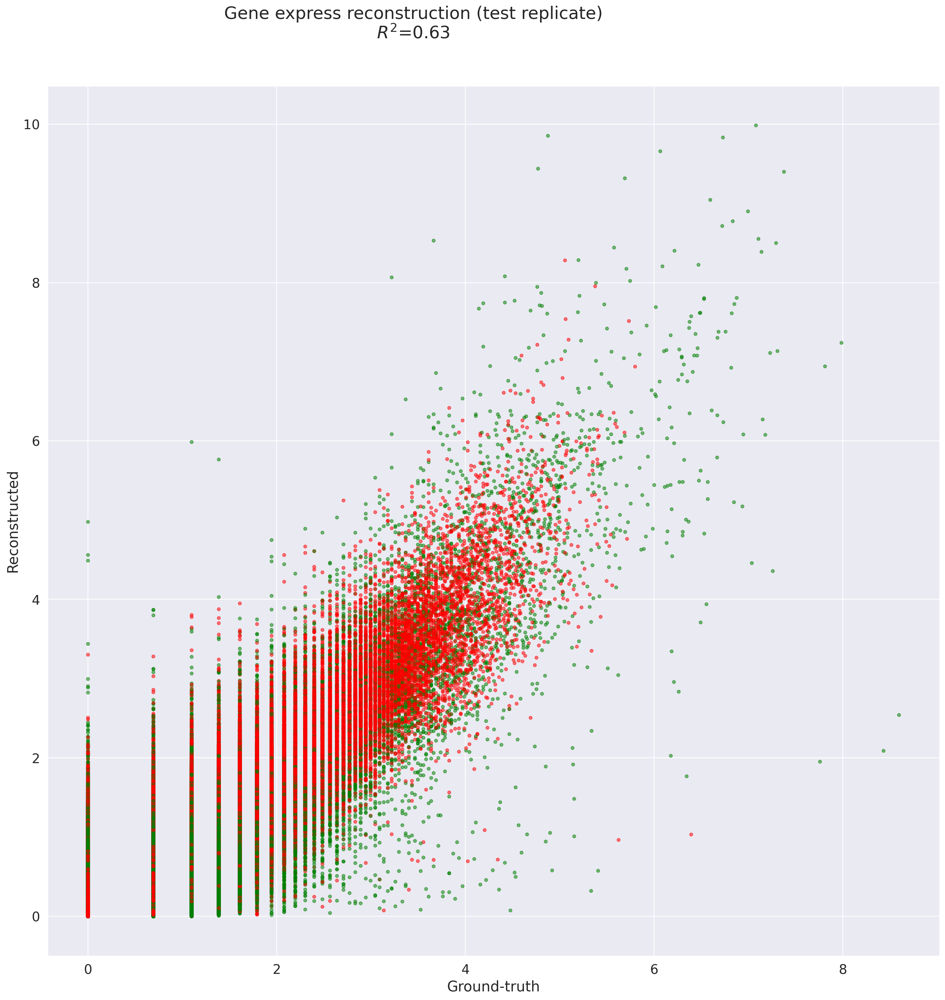

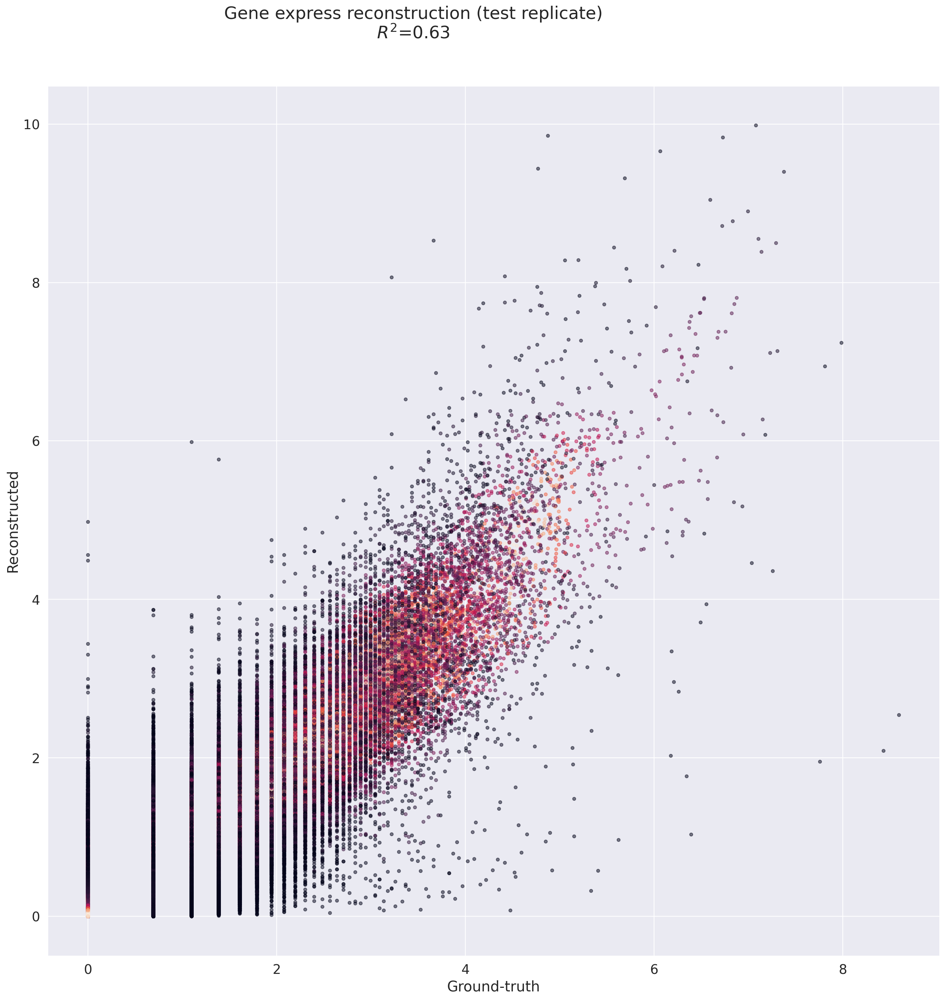

In [23]:
# Gexp reconstruction
df_x = pd.DataFrame(
    adata_train_log.X.A,
    index=adata_train.obs_names,
    columns=adata_train.var_names
)

df_x_hat = pd.DataFrame(
    x_hat_nb,
    index=adata_train.obs_names,
    columns=adata_train.var_names
    
)

r2 = utils.calc_r2(df_x.to_numpy().flatten(), df_x_hat.to_numpy().flatten())

vae_plot.display_reconst(
    df_x,
    df_x_hat,
    sample_rate=0.2,
    marker_genes=list(set([gene for genes in sig_genes_dict.values() for gene in genes])),
    title='Gene express reconstruction (test replicate)\n' + 
          r'$R^2$=' + str(round(r2, 2))
)

vae_plot.display_reconst(
    df_x,
    df_x_hat,
    sample_rate=0.2,
    density=True,
    title='Gene express reconstruction (test replicate)\n' + 
          r'$R^2$=' + str(round(r2, 2))
)

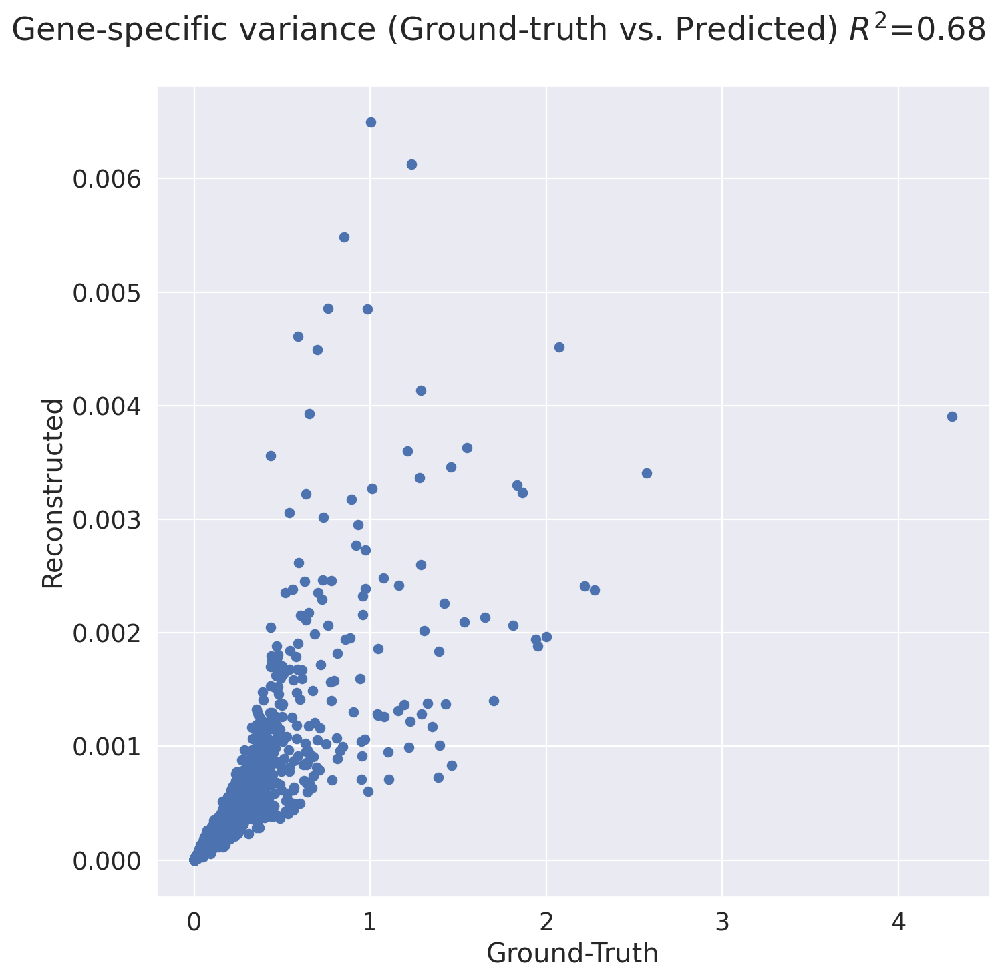

In [24]:
# Variance reconstruction
var_true = adata_train_log.X.A.var(axis=0)
var_pred = utils.disp_to_var(vae_nb.decoded.px_mu.detach().cpu().numpy(), vae_nb.decoded.px_theta)
vae_plot.display_gexp_var(var_true, var_pred, "Gene-specific variance (Ground-truth vs. Predicted)")

Trying to set attribute `.obs` of view, copying.
... storing 'feature_types' as categorical
... storing 'genome' as categorical


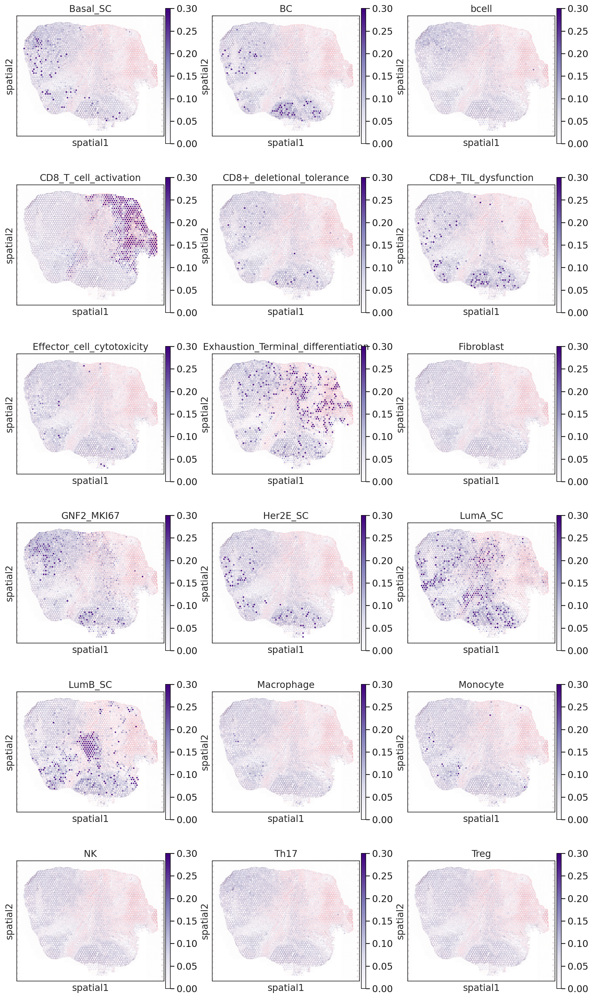

In [25]:
vae_plot.display_latent(adata_train, df_gsva, vae_nb)